# SDS to website
Purpose: By processing a list of events from an Excel spreadsheet, look for existing seismic & infrasound data in an SDS archive, instrument correct those data, and make a webpage for each event 

Steps:
1. Create an event catalog with instrument-corrected data

TO DO: 
* add support for AM network, and any data from networks run by other operators and available on IRIS
* add well data from YYYYMMDD_final.pkl files

Do we want to turn pkl files into SDS?

SCAFFOLD:
* add a detector for sonic booms after rocket launch for landers
* add any nearby IRIS seismic and infrasound data

# 1. Do full workflow for all events
* Load and correct seismic and infrasound data from FL network and XA and whatever the network was for PASSCAL equipment

Linux
Linux
['Nanometrics', 'Centaur', '40 Vpp (1)', 'Off', 'Linear phase', '100']
['Nanometrics', 'Trillium Compact 120 (Vault, Posthole, OBS)', '754 V/m/s']
['Nanometrics', 'Centaur', '40 Vpp (1)', 'Off', 'Linear phase', '100']
['Nanometrics', 'Trillium Compact 120 (Vault, Posthole, OBS)', '754 V/m/s']
['Nanometrics', 'Centaur', '40 Vpp (1)', 'Off', 'Linear phase', '100']
['Nanometrics', 'Trillium Compact 120 (Vault, Posthole, OBS)', '754 V/m/s']
['Nanometrics', 'Centaur', '40 Vpp (1)', 'Off', 'Linear phase', '100']
['Nanometrics', 'Trillium Compact 120 (Vault, Posthole, OBS)', '754 V/m/s']
['Nanometrics', 'Centaur', '40 Vpp (1)', 'Off', 'Linear phase', '100']
['Nanometrics', 'Trillium Compact 120 (Vault, Posthole, OBS)', '754 V/m/s']
['Nanometrics', 'Centaur', '1 Vpp (40)', 'Off', 'Linear phase', '100']
['JeffreyBJohnson', 'infraBSU', '0.000046 V/Pa']
poles/zeros failed when recomputing overall sensitivity
['Nanometrics', 'Centaur', '1 Vpp (40)', 'Off', 'Linear phase', '100']
['Jeff

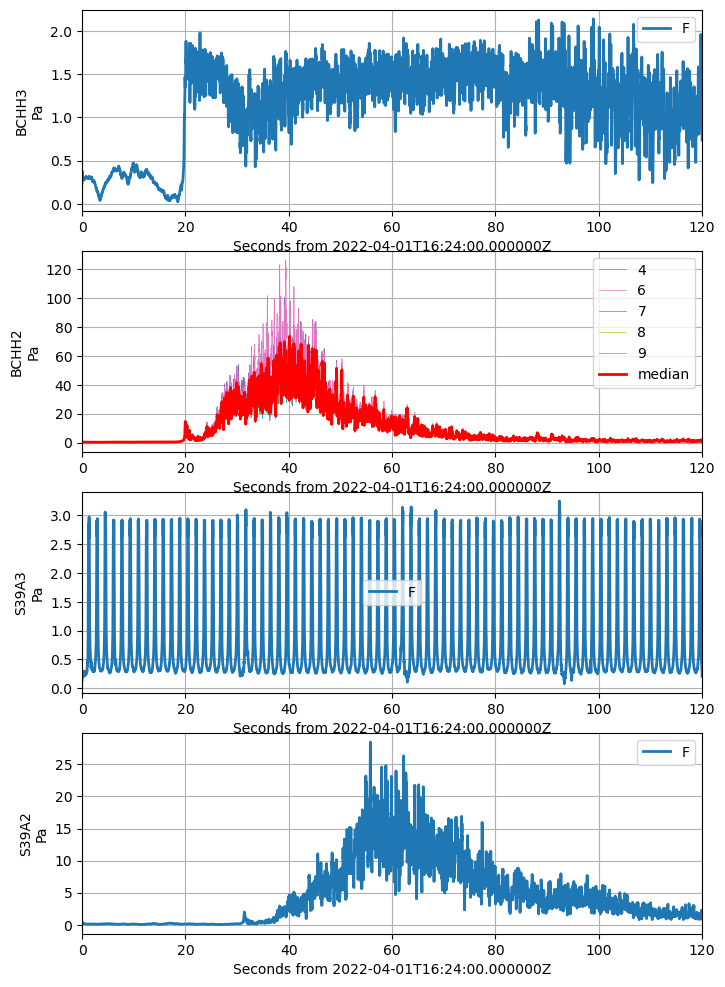

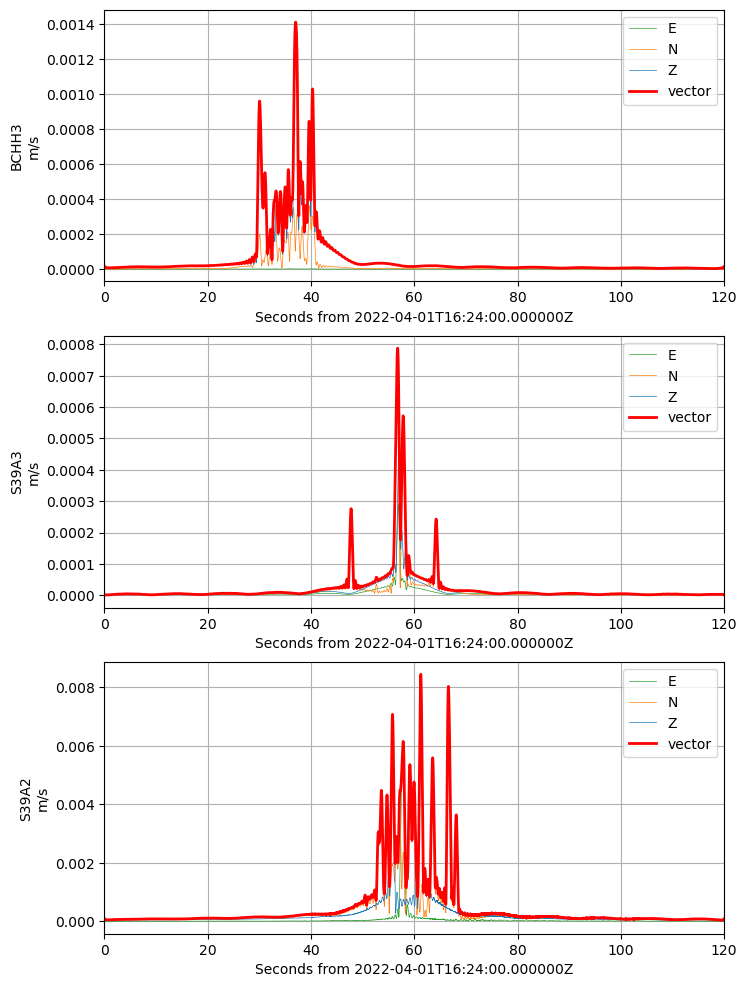

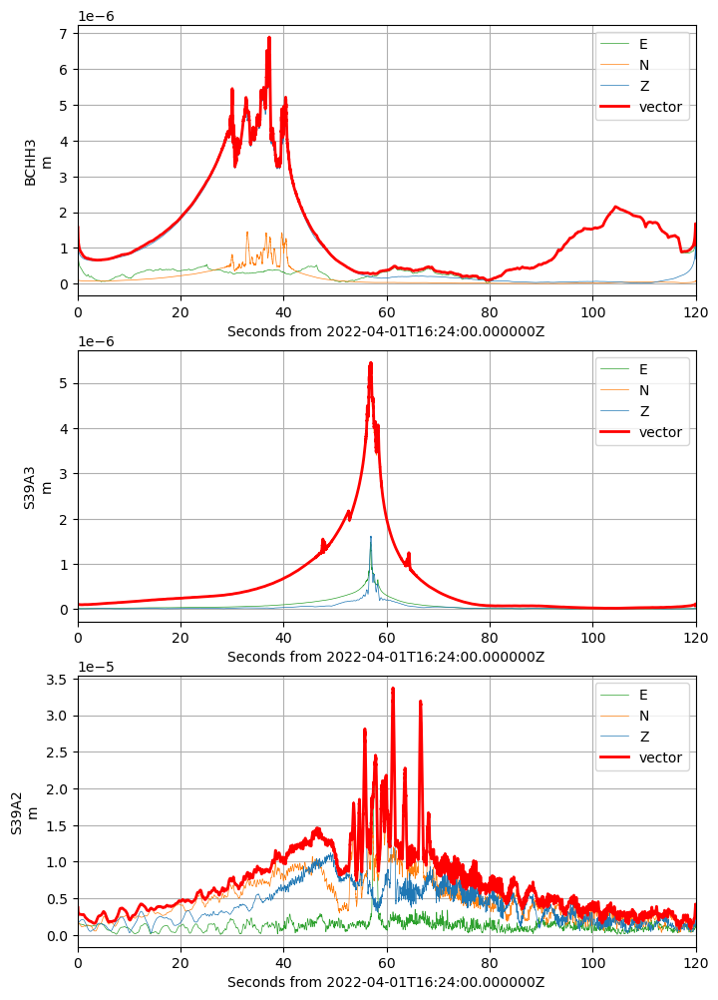

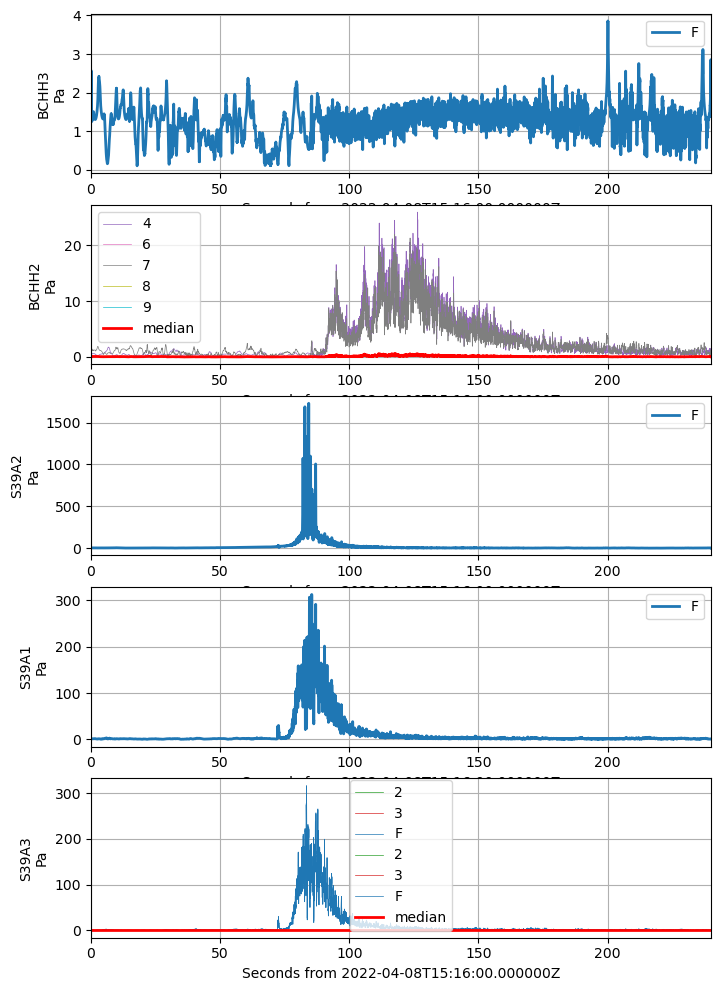

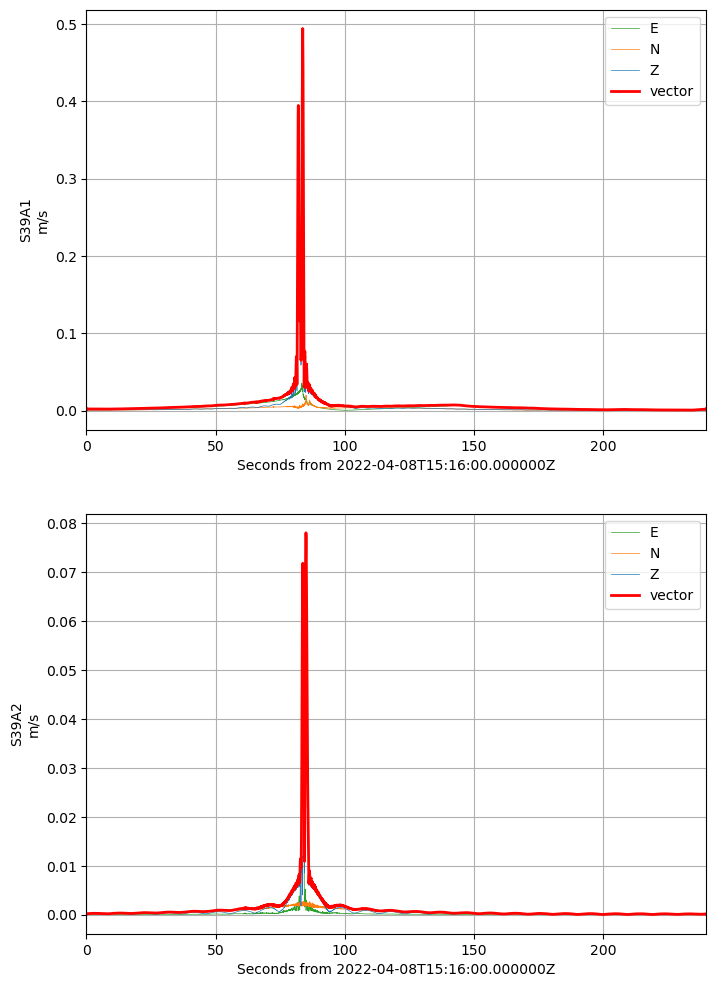

...

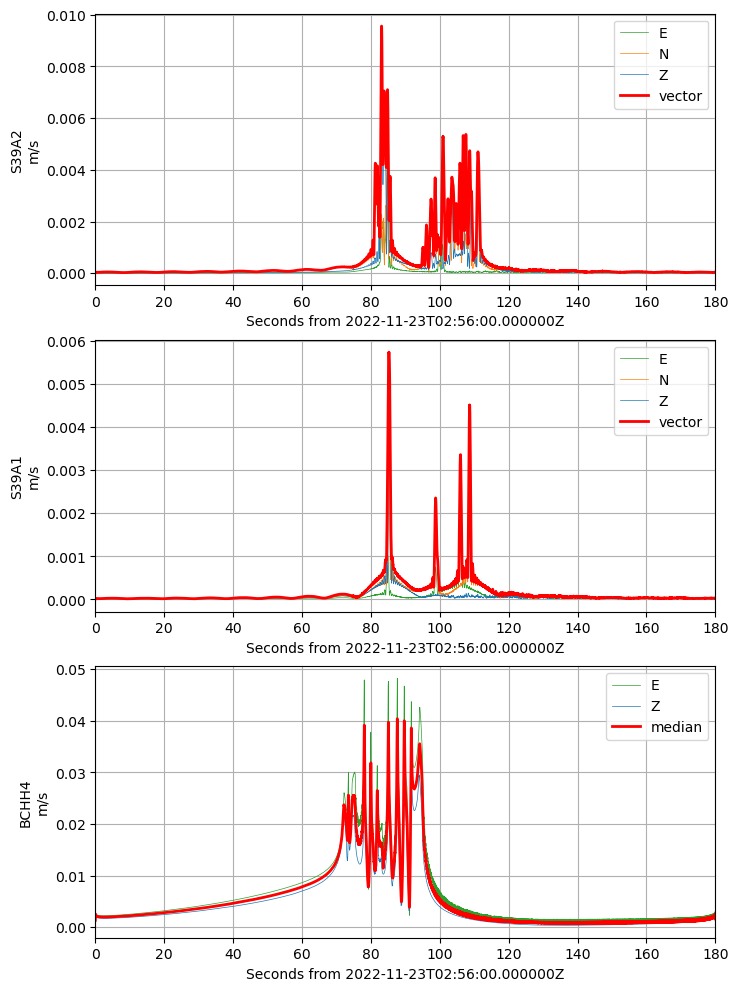

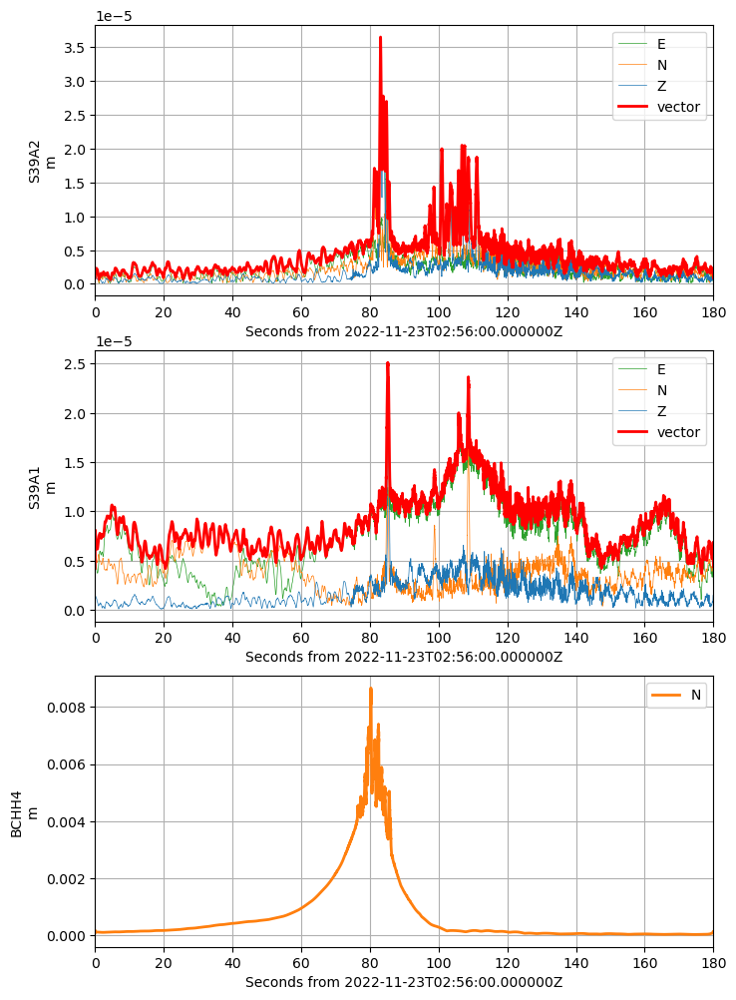

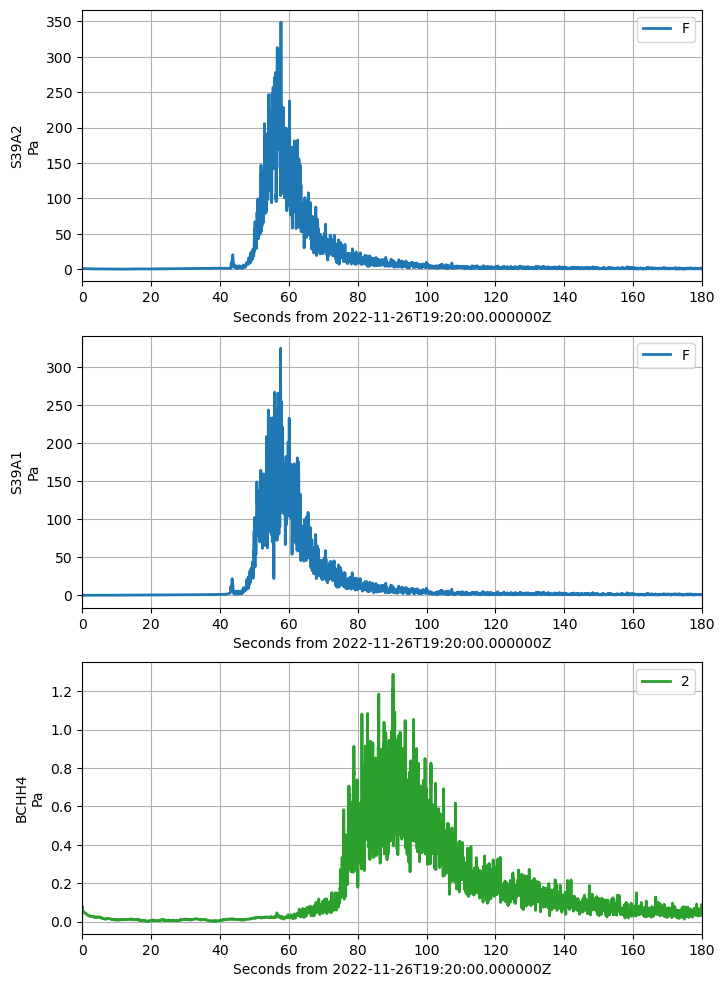

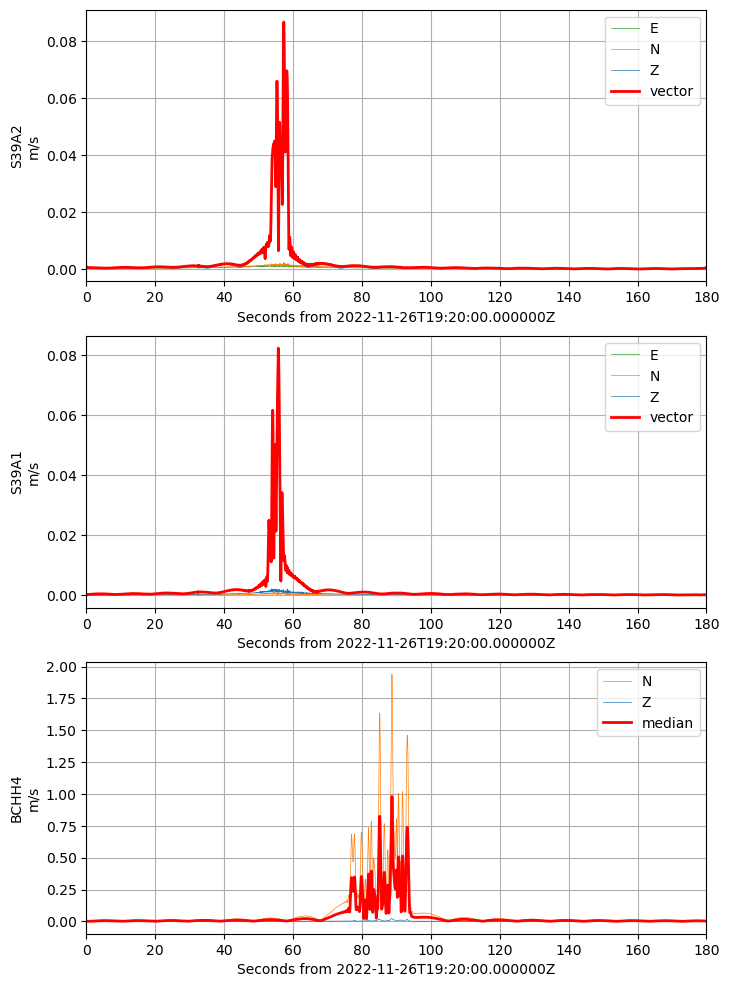

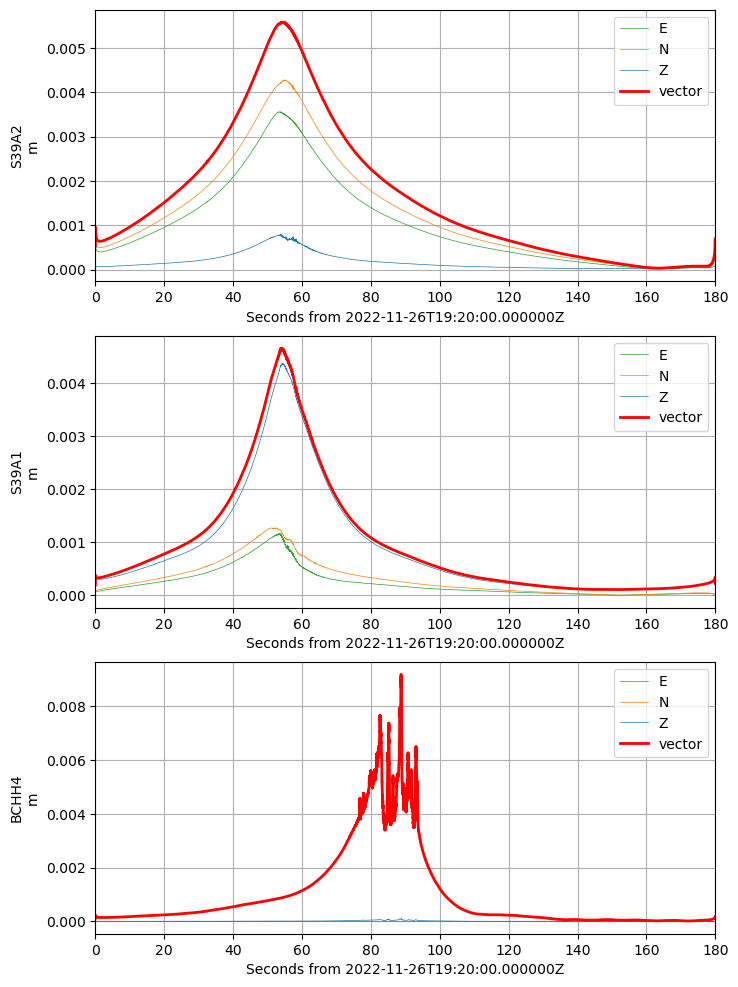

In [1]:
import os
import glob
import sys
import header
paths = header.setup_environment()
paths['SDS_TOP'] = '/data/SDS'
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import obspy
sys.path.append(os.path.join(paths['Developer'], 'SoufriereHillsVolcano', 'lib'))
import SDS
#import Spectrograms
import USF_instrument_responses
from obspy.clients.filesystem.sds import Client
#f#rom obspy.signal.cross_correlation import correlate, xcorr_max
#from obspy.signal.trigger import 
from pprint import pprint
import matplotlib.dates as dates
import libseisGT
import libWellData as LLE
import librockets as LR

sdsclient = Client(paths['SDS_TOP'])
thisSDSobj = SDS.SDSobj(paths['SDS_TOP'])

paths['EVENTS'] = os.path.join(paths['DROPBOX_DATA_TOP'], 'EVENTS')

paths['WWW_TOP'] = '/var/www/html/usfseismiclab.org/html/rocketcat'
paths['WWW_EVENTS']=os.path.join(paths['WWW_TOP'], 'EVENTS')
#paths['WWW_CONTINUOUS'] = os.path.join(paths['WWW_TOP'], 'CONTINUOUS')
paths['csv_launches'] = os.path.join(paths['WWW_TOP'], 'launches.csv')

launchesDF = LLE.removed_unnamed_columns(pd.read_csv(paths['csv_launches'], index_col=None, parse_dates=['datetime']))
#launchesDF['datetime']= pd.to_datetime(launchesDF['Date'] + ' ' +  launchesDF['Time'])
preseconds=120
eventseconds=120
postseconds=120
taperseconds=600

# need to add a detector for sonic booms too!
# 2022 responses
ondate = obspy.UTCDateTime(2022,3,17)
offdate = obspy.UTCDateTime(2022,12,5)

# seismic channels
invs1 = USF_instrument_responses.NRL2inventory('FL', 'S39A1', '00', ['HHZ', 'HHN', 'HHE'], datalogger='Centaur', sensor='TCP', Vpp=40, fsamp=100.0, ondate=ondate, offdate=offdate)
invs2 = USF_instrument_responses.NRL2inventory('FL', 'S39A2', '00', ['HHZ', 'HHN', 'HHE'], datalogger='Centaur', sensor='TCP', Vpp=40, fsamp=100.0, ondate=ondate, offdate=offdate)
invs3 = USF_instrument_responses.NRL2inventory('FL', 'S39A3', '00', ['HHZ', 'HHN', 'HHE'], datalogger='Centaur', sensor='TCP', Vpp=40, fsamp=100.0, ondate=ondate, offdate=offdate)
invs4 = USF_instrument_responses.NRL2inventory('FL', 'BCHH3', '00', ['HHZ', 'HHN', 'HHE'], datalogger='Centaur', sensor='TCP', Vpp=40, fsamp=100.0, ondate=ondate, offdate=offdate)
invs5 = USF_instrument_responses.NRL2inventory('FL', 'BCHH4', '10', ['HHZ', 'HHN', 'HHE'], datalogger='Centaur', sensor='TCP', Vpp=40, fsamp=100.0, ondate=ondate, offdate=offdate)
seismicinv = invs1 + invs2 + invs3 + invs4 + invs5

# infrasound
date_BCHH3_change = obspy.UTCDateTime(2022,5,26) # looking at files, it seems we actually have no data for BCHH3 after this - we just called it BCHH4
invi1 = USF_instrument_responses.NRL2inventory('FL', 'S39A1', '10', ['HDF'], datalogger='Centaur', sensor='infraBSU', Vpp=1, fsamp=100.0, ondate=ondate, offdate=offdate)
invi2 = USF_instrument_responses.NRL2inventory('FL', 'S39A2', '10', ['HDF'], datalogger='Centaur', sensor='infraBSU', Vpp=1, fsamp=100.0, ondate=ondate, offdate=offdate)
invi3 = USF_instrument_responses.NRL2inventory('FL', 'S39A3', '10', ['HDF'], datalogger='Centaur', sensor='infraBSU', Vpp=1, fsamp=100.0, ondate=ondate, offdate=offdate)
invi4 = USF_instrument_responses.NRL2inventory('FL', 'BCHH2', '10', ['HD4'], datalogger='Centaur', sensor='Chap', Vpp=40, fsamp=100.0, ondate=ondate, offdate=offdate)
invi5 = USF_instrument_responses.NRL2inventory('FL', 'BCHH2', '10', ['HD5', 'HD6'], datalogger='Centaur', sensor='infraBSU', Vpp=40, fsamp=100.0, ondate=ondate, offdate=offdate)
invi6 = USF_instrument_responses.NRL2inventory('FL', 'BCHH2', '10', ['HD7', 'HD8', 'HD9'], datalogger='Centaur', sensor='infraBSU', Vpp=1, fsamp=100.0, ondate=ondate, offdate=offdate)
invi7 = USF_instrument_responses.NRL2inventory('FL', 'BCHH3', '10', ['HDF'], datalogger='Centaur', sensor='infraBSU', Vpp=1, fsamp=100.0, ondate=ondate, offdate=date_BCHH3_change)
invi8 = USF_instrument_responses.NRL2inventory('FL', 'BCHH3', '10', ['HDF'], datalogger='Centaur', sensor='infraBSU', Vpp=40, fsamp=100.0, ondate=date_BCHH3_change, offdate=offdate)
invi9 = USF_instrument_responses.NRL2inventory('FL', 'BCHH4', '00', ['HDF', 'HD2', 'HD3'], datalogger='Centaur', sensor='infraBSU', Vpp=1, fsamp=100.0, ondate=ondate, offdate=offdate)

infrainv = invi1 + invi2 + invi3 + invi4 + invi5 + invi6 + invi7 + invi8 + invi9

inv = seismicinv + infrainv

for idx, eventrow in launchesDF.iterrows():
    # get start and end time. remember that spreadsheet is in UTC. well data are in local time but summer time is assumed throughout (UTC-4)
    launchtimeUTC = eventrow['datetime']

    # create event directory
    EVENTDIR = os.path.join(paths['WWW_EVENTS'], launchtimeUTC.isoformat())
    if not os.path.isdir(EVENTDIR):
        os.makedirs(EVENTDIR)  

    print('Processing launch at %s' % launchtimeUTC.strftime('%Y-%m-%d %H:%M:%S')) 
    st = LR.sds2eventStream(launchtimeUTC, sdsclient, thisSDSobj, pretrig=preseconds+taperseconds, posttrig=eventseconds+postseconds+taperseconds)


    # Define the station you want to remove (e.g., 'STATION_NAME')
    station_to_remove = "DWPF"
    #st = st.select(lambda tr: tr.stats.station != station_to_remove)
    for tr in st:
        if tr.stats.station == station_to_remove:
            st.remove(tr)
        elif tr.data.size == 0 or all(tr.data == 0):
            st.remove(tr)

    st = st.select(network='FL') # while AM, XA, and 1R are also valid, we need to get instrument response data for them

    #st = st.filter(lambda trace: trace.data.size > 0 and not all(trace.data == 0))

    # all these functions safe for well traces too - if they were in the Stream objects as they were when we converted well data to SDS
    st.plot(equal_scale=False, outfile=os.path.join(EVENTDIR, 'raw.png'));
    #LR.clean(st, taperseconds) # despike, detrend, taper, high pass filter, trim
    for tr in st:
        trace_seconds = tr.stats.delta * tr.stats.npts
        libseisGT.clean_trace(tr, taperFraction=taperseconds/trace_seconds, filterType="highpass", freq=0.01, corners=2, zerophase=True, inv=None)
    
    infrasound_st = st.select(channel='[ESBH]D?')
    #apply_calibration_correction(infrasound_st) 
    USF_instrument_responses.correctUSFstations(infrasound_st, apply_calib=True, attach=False, return_inventories=False)
    #libseisGT.removeInstrumentResponse(infrasound_st, preFilter = None, outputType = "DISP", inventory = infrainv)    
    LR.detect_incorrect_p2p_voltage_setting(infrasound_st)

    seismic_st = st.select(channel='[ESBH]H?')
    seismic_st = seismic_st.select(network='FL')
    velocity_st = seismic_st.copy()
    #velocity_st = remove_response(seismic_st, output='VEL')
    libseisGT.removeInstrumentResponse(velocity_st, preFilter = None, outputType = "VEL", inventory = seismicinv)
    LR.detect_incorrect_p2p_voltage_setting(velocity_st) 

    displacement_st = seismic_st.copy()
    #displacement_st = remove_response(seismic_st, output='DISP')
    libseisGT.removeInstrumentResponse(displacement_st, preFilter = None, outputType = "DISP", inventory = seismicinv)
    LR.detect_incorrect_p2p_voltage_setting(displacement_st) 
    
    # write corrected event out
    #correctedfile =  os.path.join(EVENTDIR, '%s.pkl' % launchtimeUTC.strftime('%Y%m%dT%H%M%S'))
    #st.write(correctedfile, format='PICKLE') 

    best_trig = LR.detectEvent(infrasound_st + velocity_st + displacement_st)
    pad_secs = 10
    trigtime = launchtimeUTC
    duration = eventseconds
    if len(best_trig)>0:    
        trigtime = best_trig['time']
        duration = best_trig['duration']
    trimtime0 = LR.floor_minute(trigtime-pad_secs)
    trimtime1 = LR.ceil_minute(trigtime+duration+pad_secs)
    infrasound_st.trim(starttime=trimtime0, endtime=trimtime1)
    velocity_st.trim(starttime=trimtime0, endtime=trimtime1)
    displacement_st.trim(starttime=trimtime0, endtime=trimtime1)

    # SCAFFOLD
    # generate seismic and infrasound figures - but change to add RSAM pandas plots, spectrograms and spectra, etc.
    '''
    fig, ax = plt.subplots(figsize=(10, 6))  # Set a custom figure size (width, height)
    infrasound_st.plot(fig=fig, equal_scale=False, outfile=os.path.join(EVENTDIR, 'infrasound.png'));
    fh,axh=libseisGT.mulplt(infrasound_st, bottomlabel='', ylabels=[], MAXPANELS=6)
    fh.savefig(fname=os.path.join(EVENTDIR, 'infrasound2.png'))
    '''
    #super_stream_plot(velocity_st, dpi=100, Nmax=6, rank='ZFODNE123456789', equal_scale=False, outfile=os.path.join(EVENTDIR, 'velocity.png'))
    #super_stream_plot(displacement_st, dpi=100, Nmax=6, rank='ZFODNE123456789', equal_scale=False, outfile=os.path.join(EVENTDIR, 'displacement.png'))
    LR.plot_seismograms(infrasound_st, outfile=os.path.join(EVENTDIR, 'infrasound.png'), bottomlabel=None, ylabels=None, units='Pa', channels='F123456789')
    LR.plot_seismograms(velocity_st, outfile=os.path.join(EVENTDIR, 'velocity.png'), bottomlabel=None, ylabels=None, units='m/s')
    LR.plot_seismograms(displacement_st, outfile=os.path.join(EVENTDIR, 'displacement.png'), bottomlabel=None, ylabels=None, units='m')
    #plot_envelope2(infrasound_st, outfile=os.path.join(EVENTDIR, 'infrasound5.png'), units='Pa')
    #plot_envelope2(velocity_st.select(channel='HHZ'), outfile=os.path.join(EVENTDIR, 'velocity2.png'), units='m/s')
    #plot_envelope2(displacement_st.select(channel='HHZ'), outfile=os.path.join(EVENTDIR, 'displacement2.png'), units='m')
    '''
    fig, ax = plt.subplots(figsize=(10, 6))  # Set a custom figure size (width, height)
    velocity_st.plot(fig=fig, equal_scale=False, outfile=os.path.join(EVENTDIR, 'velocity.png'));
    fig, ax = plt.subplots(figsize=(10, 6))  # Set a custom figure size (width, height)
    displacement_st.plot(fig=fig, equal_scale=False, outfile=os.path.join(EVENTDIR, 'displacement.png'));    
    # Optionally, set the aspect ratio (e.g., 2:1 aspect ratio)
    #ax.set_aspect(2.0)
    '''